<a href="https://colab.research.google.com/github/0ginny/TIL/blob/main/240410_Computer_Vision_Masterclass_Face_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Computer Vision Masterclass - Face detection

## OpenCV

### Loading the image

In [2]:
import cv2

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [4]:
%cd /content/gdrive/MyDrive/Colab Notebooks/Vision_AZ

/content/gdrive/MyDrive/Colab Notebooks/Vision_AZ


In [6]:
image = cv2.imread('./Images/people1.jpg')

In [5]:
image.shape # 너비 1280 픽셀, 높이 1920 픽셀, 3개의 채널 (GBR)

(1280, 1920, 3)

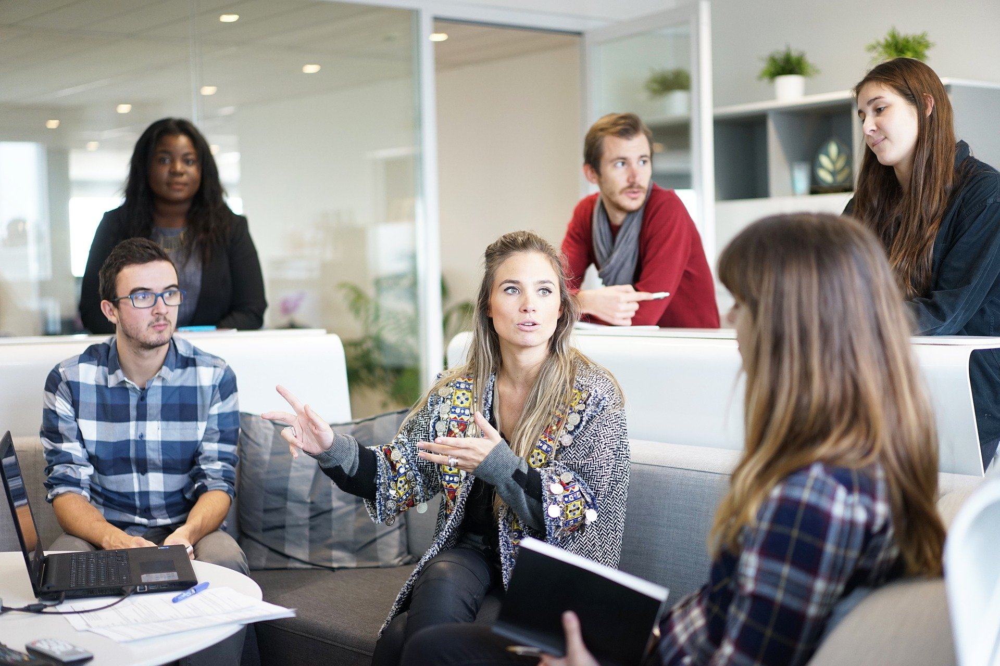

In [7]:
# cv2.imshow(image) # 이것만 있으면 코랩에선 쓸 수 없어. 아래와 같이 써야해
from google.colab.patches import cv2_imshow
cv2_imshow(image)

In [10]:
# 이미지 사이즈 변경
image = cv2.resize(image, (800, 600))
image.shape

(600, 800, 3)

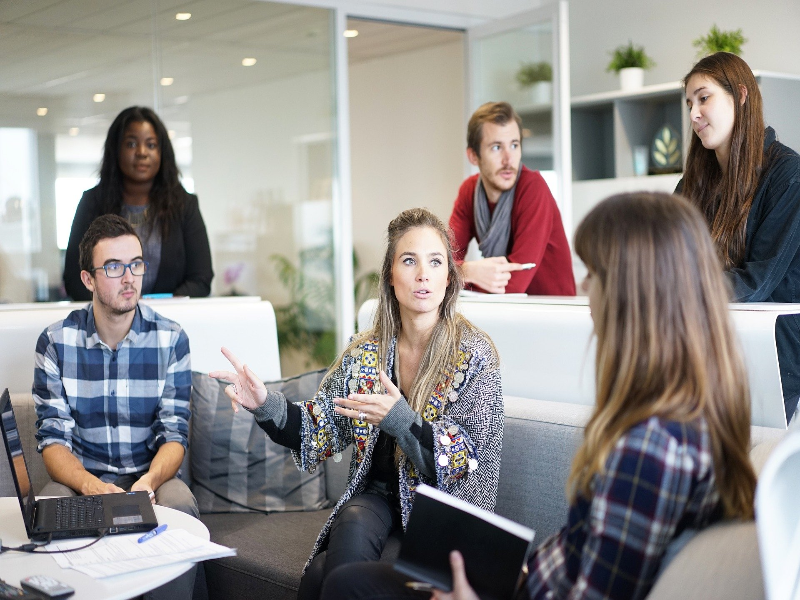

In [11]:
cv2_imshow(image)

In [13]:
600 * 800 * 3, 600 * 800, 1440000 - 480000 # 이미지에 저장된 총 정보수 , 그래서 흑백이 이미지 처리에 유리해

(1440000, 480000, 1392000)

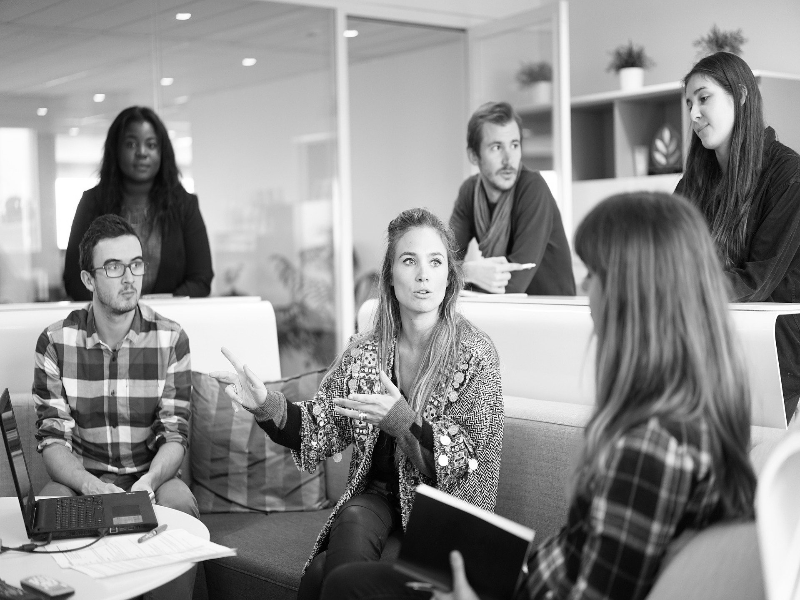

In [14]:
# 흑백으로 만들기
image_gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
cv2_imshow(image_gray)

In [15]:
image_gray.shape

(600, 800)

### Detecting faces ( using cascade )

In [7]:
face_detector = cv2.CascadeClassifier('./Cascades/haarcascade_frontalface_default.xml') # 트레인 완료된 xml 을 불러오기

In [8]:
# 얼굴 탐지 좌표 얻기 (x, y, w, h)
detections = face_detector.detectMultiScale(image_gray)

NameError: name 'image_gray' is not defined

In [19]:
detections # 6개의 정면 탐지

array([[677,  72,  68,  68],
       [115, 124,  53,  53],
       [475, 123,  59,  59],
       [387, 233,  73,  73],
       [ 92, 239,  66,  66],
       [390, 323,  56,  56]], dtype=int32)

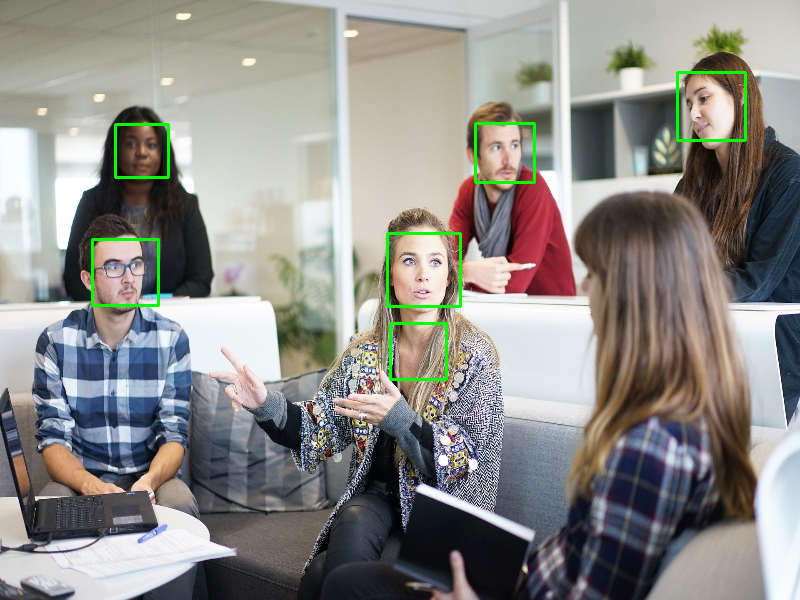

In [20]:
# 표시하기
for (x, y, w, h) in detections:
    # 사각형으로 표시하기
    cv2.rectangle(image, # 그릴 이미지
                  (x, y ), #사각형 시작
                  (x+w, y+h), # end rectangle
                  (0, 255, 0 ), # color of pen
                  2 ) # tickness of pen
cv2_imshow(image)

### Haarcascade parameters

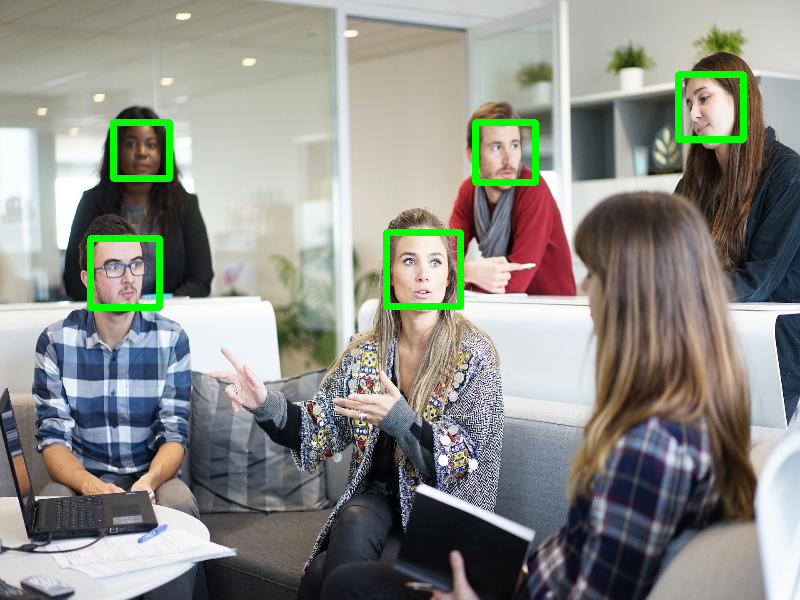

In [21]:
image = cv2.imread('./Images/people1.jpg')

image = cv2.resize(image, (800, 600))
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.09) # 거리에 따라 이미지가 커지고 작아지는 것을 조절하는 파라미터/ 이미지 사이즈에 맞는 값을 줘야해/ 작으면 감지가 많고 높으면 감지가 안돼.
# 감지 대상이 큰 이미지의 경우 값을 크게 하는 것이 좋고, 작은 대상을 감지할 경우 값을 작게하는 것이 좋아.


for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 5)
cv2_imshow(image)

47 47
47 47
49 49
49 49
52 52
51 51
46 46
44 44
51 51
50 50
51 51
47 47


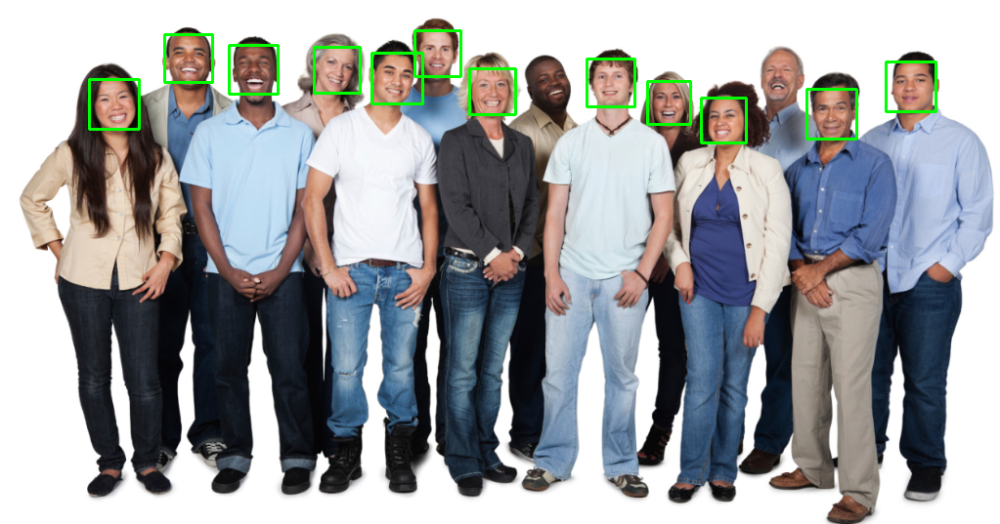

In [22]:
image = cv2.imread('./Images/people2.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray, scaleFactor=1.2,
                                            minNeighbors=7,  # 주변에 감지가 있어야지 인지, 독립적으로
                                            minSize=(20,20), # 얼굴의 최소 사이즈
                                            maxSize=(100,100)) # 얼굴의 최대 사이즈
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)
cv2_imshow(image)

### Eye detection

#### 내가 한 번 해보자

In [ ]:
eye_detection = cv2.CascadeClassifier('./Cascades/haarcascade_eye.xml')
image = cv2.imread('./Images/people1.jpg')

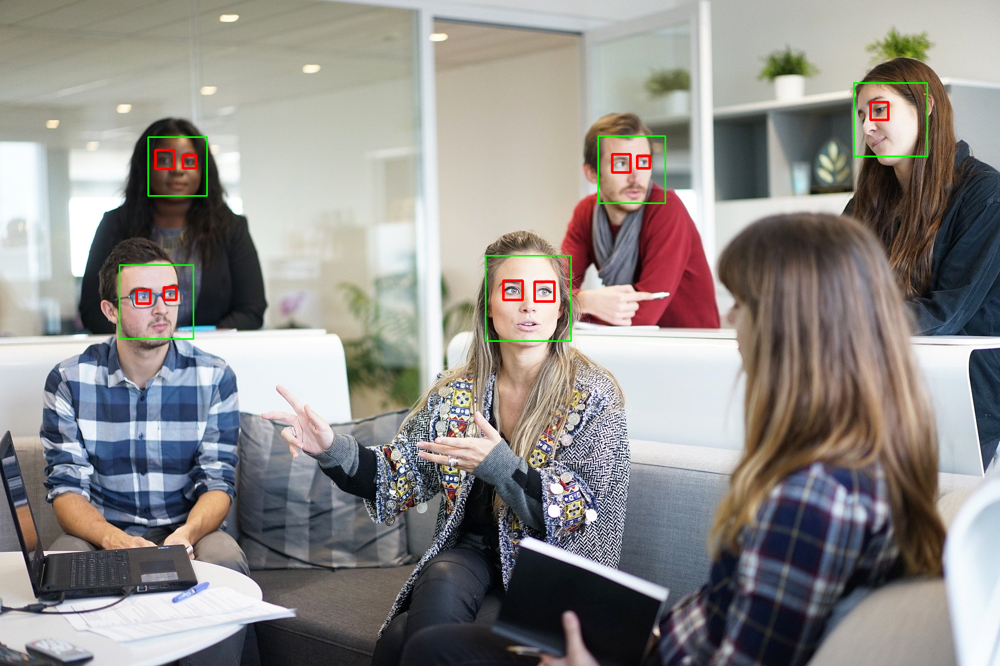

In [31]:
image = cv2.imread('./Images/people1.jpg')
# 사이즈 변겨
# image = cv2.resize(image, (1080, 720))
image_gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

# 얼굴 감지
detections = face_detector.detectMultiScale(image_gray, scaleFactor=1.1,
                                            minNeighbors=7,  # 주변에 감지가 있어야지 인지, 독립적으로
                                            minSize=(50,50), # 얼굴의 최소 사이즈
                                            maxSize=(200,200)) # 얼굴의 최대 사이즈
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)

# 눈 감지
detections = eye_detection.detectMultiScale(image_gray,
                                            scaleFactor = 1.1,
                                            minNeighbors = 10,
                                            maxSize = (50, 50))
for (x, y, w, h) in detections :
    cv2.rectangle(image, (x, y) , (x + w, y + h), (0, 0, 255), 3 )
cv2_imshow(image)

### Other objects

#### Cars

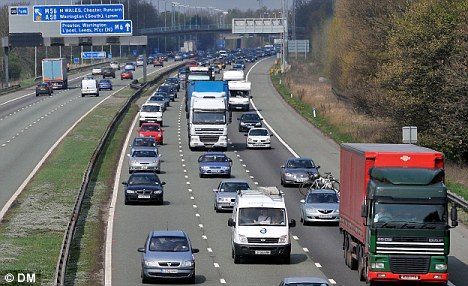

In [32]:
car_img = cv2.imread('./Images/car.jpg')
cv2_imshow(car_img)

In [34]:
car_img.shape

(286, 468, 3)

In [33]:
car_detect = cv2.CascadeClassifier('./Cascades/cars.xml')

52 52
55 55
73 73
65 65
83 83
111 111
60 60
69 69
105 105
68 68
95 95
80 80
185 185
63 63
132 132
213 213


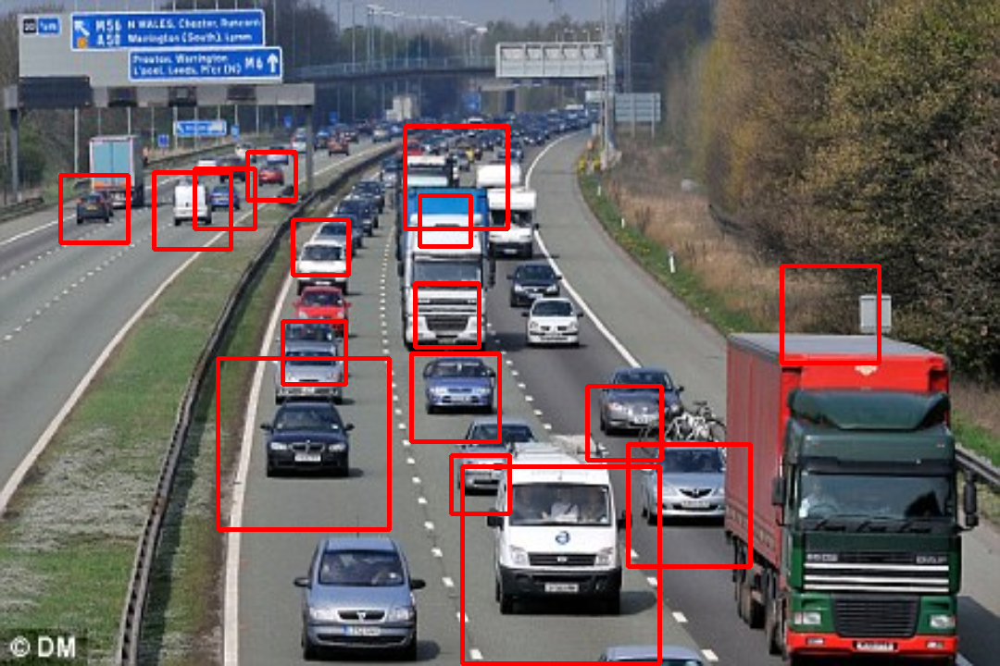

In [48]:
car_img = cv2.imread('./Images/car.jpg')
car_img = cv2.resize(car_img, (1080, 720))
car_gray = cv2.cvtColor(car_img, cv2.COLOR_BGR2GRAY)
detections_car = car_detect.detectMultiScale(car_gray,
                                               scaleFactor = 1.01,
                                             minNeighbors = 10,
                                             minSize = (50,50))

for (x, y, w, h) in detections_car :
    print(w,h)
    cv2.rectangle(car_img, (x, y) , (x + w, y + h), (0, 0, 255), 3 )
cv2_imshow(car_img)

#### Clocks

#### Full body

## Hog 방식에 대해서

- 색의 미분을 계산해.
    - 미분 값이 작으거나 0 이면 변화가 없는 거지
    - 이러한 변화량을 주목해.
- 그 엣지들을 수집해서, 움직이는 객체를 찾아낼 수 있어.
- 그러한 그래디언트의 히스토그램을 만들어서
    - 이 히스토그램은 객체마다 다를 거야. 그래서 그걸로 비교해.


- 미분 값은 주변 픽셀과 픽셀값 차를 구하면 돼.

## Dlib

In [8]:
import dlib

### Detecting faces with HOG

In [50]:
image = cv2.imread('./Images/people2.jpg')

In [51]:
face_detector_hog = dlib.get_frontal_face_detector()

In [53]:
# 흑백으로 전환하지 않을 때 더 잘 돼. 복잡한 계산을 하므로
detections = face_detector_hog(image,
                                    1) # 이미지 크기, scaleFactor 와 비슷 , 높은 값일수록 작은 경계 상자가 나타나 (더 깐깐하게? 감지돼.), 낮으면 큰 경계 상자가 나오겠지

In [55]:
detections, len(detections) #

(rectangles[[(429, 38) (465, 74)], [(665, 90) (701, 126)], [(717, 103) (760, 146)], [(909, 70) (952, 113)], [(828, 98) (871, 142)], [(605, 70) (641, 106)], [(777, 62) (813, 98)], [(485, 78) (521, 114)], [(386, 60) (429, 103)], [(170, 41) (213, 84)], [(93, 89) (136, 132)], [(237, 50) (280, 94)], [(323, 50) (367, 94)], [(544, 65) (588, 108)]],
 14)

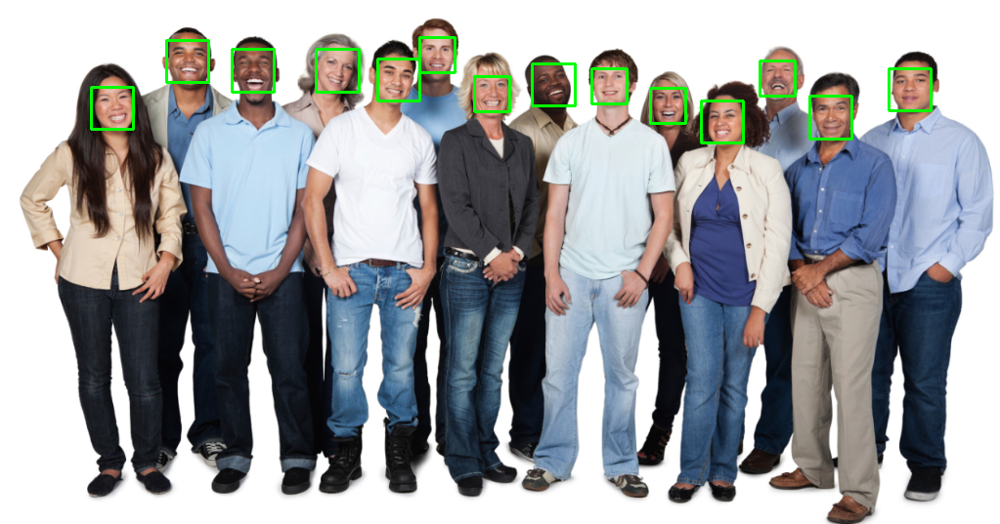

In [57]:
for face in detections:
    # detection 요소 알아보기
    # print(face)
    # print(face.left())
    # print(face.top())
    # print(face.right())
    # print(face.bottom())
    l, t, r, b = face.left(), face.top(), face.right(), face.bottom()

    cv2. rectangle(image, (l, t), (r,b), (0,255,0), 2)
cv2_imshow(image)

### Detecting faces with CNN (Convolutional Neural Networks)

In [58]:
image = cv2.imread('./Images/people2.jpg')

In [59]:
cnn_detector = dlib.cnn_face_detection_model_v1('./Weights/mmod_human_face_detector.dat')

1.1440608501434326
1.1370506286621094
1.127898931503296
1.1200274229049683
1.1149379014968872
1.1131560802459717
1.0975687503814697
1.0942119359970093
1.0853146314620972
1.0801897048950195
1.0800751447677612
1.0784766674041748
1.0664023160934448
1.06417977809906


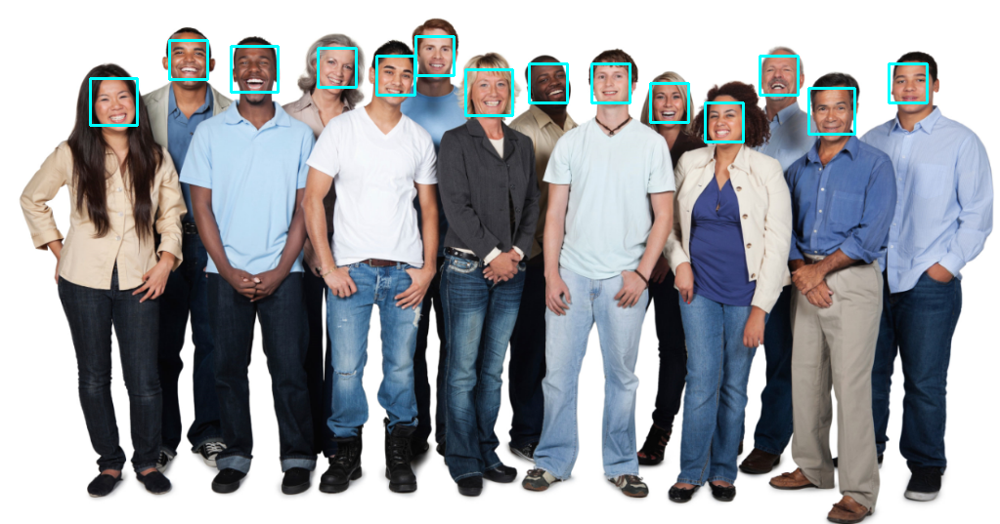

In [64]:
detections = cnn_detector(image, 1)
for face in detections :
    l, t, r, b, c = face.rect.left(), face.rect.top(), face.rect.right(), face.rect.bottom(), face.confidence
    print(c) # 감지신뢰도, 높으면 더 신뢰할만한 감지.
    cv2.rectangle(image, (l,t), (r,b), (255,255,0), 2)
cv2_imshow(image)

### Haarcascade x HOG x CNN

In [65]:
img = cv2.imread('./Images/people3.jpg')
img.shape

(294, 626, 3)

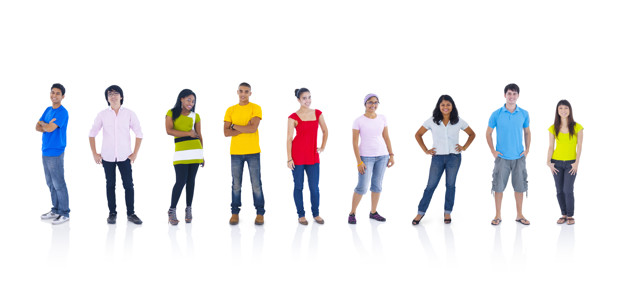

In [66]:
cv2_imshow(img)

#### Haarcascade

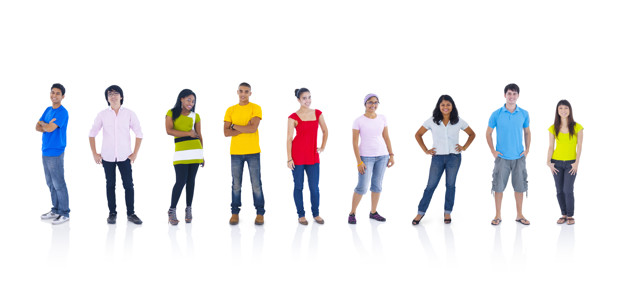

In [18]:
img_h = cv2.imread('./Images/people3.jpg')
img_h_g = cv2.cvtColor(img_h, cv2.COLOR_BGR2GRAY)
detect_h = cv2.CascadeClassifier('./Cascades/haarcascade_frontalface_default.xml')
detections_h = detect_h.detectMultiScale(img_h_g, scaleFactor = 1.05)
for (x,y,w,h) in detections_h:
    print(w,h)
    cv2.rectangle(img_h,(x,y),(x+w,y+h), (0,255,255), 2)
cv2_imshow(img_h)

#### HOG

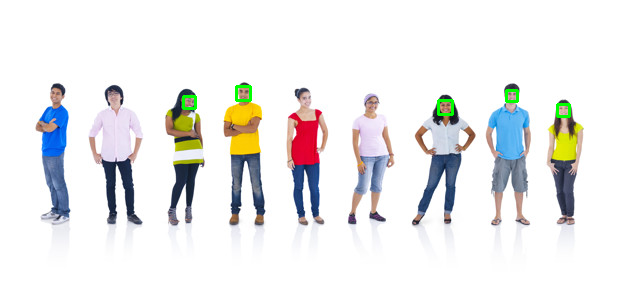

In [9]:
img_hog = cv2.imread('./Images/people3.jpg')
hog_detector = dlib.get_frontal_face_detector()
detections_hog = hog_detector(img_hog, 5)
for body in detections_hog:
    l, t, r, b = body.left(), body.top(), body.right(), body.bottom()
    cv2.rectangle(img_hog,(l,t), (r,b), (0,255,0),2)
cv2_imshow(img_hog)

#### CNN

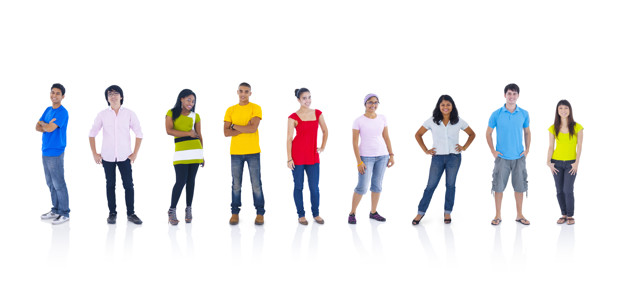

In [12]:
img_c =  cv2.imread('./Images/people3.jpg')
cnn_detector = dlib.cnn_face_detection_model_v1('./Weights/mmod_human_face_detector.dat')
detections_cnn = cnn_detector(img_c, 1)
for body in detections_cnn:
    l, t, r, b,c = body.rect.left(), body.rect.top(), body.rect.right(), body.rect.bottom() , body.confidence
    print(c)
    cv2.rectangle(img_c,(l,t), (r,b), (0,255,0),1)
cv2_imshow(img_c)

이렇게 작은 분류에선 hog가 가장 나았네

이런식으로 한가지 방법이 아닌 다른 여러가지 방법을 구해보고 비교해봐야해.